<p>
<h1><b><center></center></b></h1>
<center><img src="https://drive.google.com/uc?id=1UJc1ci41G6ahJ7ProKvunUOIBcTXZ6ZG" align="center" width="550"></center>
</p>
<h1><b><center>Relatividad y Gravitación</center></b></h1>
<h2><b><center>Prof. Jorge I. Zuluaga</center></b></h1>
<h2><b><center>Problem Set 7</center></b><h2>
<h3><b><center>Geodésicas</center></b><h3>
<h5><center><b>Asignada</b>: Jueves 31 de Octubre de 2024</center><h5>
<h5><center><b>Entrega</b>: Jueves 7 de Noviembre de 2024</center><h5>
<small><center><i>Última actualización del profesor</i>: Lunes 5 de Noviembre de 2024, 5:30 am</center></small>

**NOTA**: Al inicio de la solución entregada debe incluir una relación de los puntos y los literales que resolvió completamente.

A continuación se presentan un conjunto de ejercicios o problemas para resolver usando la teoría vista en las últimas lecciones del curso. Resuelva los ejercicios *a mano* y suba una versión digitalizada en el espacio del ítem respectivo en Google Classroom.

**NOTA**: Los ejercicios marcados como **[Numérico]** deben resolverse exclusivamente usando las herramientas numéricas vistas en el curso, incluso si tienen una solución que puede obtenerse de forma enteramente analítica. El objetivo es que se aprendan a utilizar esas herramientas.

##**Solucionado $\checkmark\checkmark$**

1. **Propiedades de los símbolos de Christoffel**. Usando la definición de los símbolos de Christoffel vista en clase, demuestre que:

  a. $\Gamma_{\mu\nu}^{\sigma}$ no es un tensor.

  b. Las derivadas de la métrica se pueden escribir como:

  $$
  \begin{aligned}
& \mathrm{g}_{\alpha \beta, \gamma}=\Gamma_{\alpha \beta \gamma}+\Gamma_{\beta \alpha \gamma} \\
& \mathrm{g}^{\alpha \beta}{ }_{, \gamma}=-\mathrm{g}^{\mu \beta} \Gamma_{\mu \gamma}^\alpha-\mathrm{g}^{\alpha \mu} \Gamma_{\mu \gamma}^\beta
\end{aligned}
  $$
  donde se ha introducido el símbolo de Christoffel con índices covariantes:

  $$
  \Gamma_{\alpha \mu \nu}=g_{\alpha \lambda} \Gamma_{\mu \nu}^\lambda
  $$

##**Solucionado $\checkmark\checkmark$**

2. **La derivada direccional y los símbolos de Christoffel**. En *geometría diferencial* los símbolos de Christoffel aparecen cuando queremos determinar la variación de un vector general $\bar{A}$ a lo largo de una línea de universo $\bar{x}(\lambda)$, donde $\lambda$ es un parámetro que describe la línea, es decir cuando queremos calcular $d\bar{A}(\bar{x}(\lambda))/d\lambda$. Llamamos a esta la *derivada de línea* de un vector.

  Para saber cuánto vale esta derivada, empezamos por escoger una _base coordenada curvilinea_ $\bar{e}_\alpha(\bar{x})$ (lo de curvilinea significa que los vectores unitarios pueden depender de las coordenadas), y definimos la variación de los elementos de la base como:

  $$
\frac{\partial\bar e_\mu}{\partial x^\nu} \equiv C^{\alpha}_{\mu\nu}\bar{e}_\alpha
$$
donde, como se ve de la definición, $C^{\alpha}_{\mu\nu}$ son un conjunto de coeficientes que conectan la variación de un vector de la base respecto a una de las variables, con los demás vectores de la base, una cantidad que se conoce en geometría diferencial como *conexión afín*.

  Entonces:

  a. Demuestre que, con esta definición y teniendo en cuenta que $\bar A = A^\lambda \bar{e}_{\lambda}$, la derivada total del vector $\bar A$ se puede escribir como:

  $$
  \frac{d\bar A}{d\lambda} =  \left(\frac{dA^\sigma}{d\lambda} + C^{\sigma}_{\mu\nu} A^\mu\frac{dx^\nu}{d\lambda}\right)\bar e_\sigma
  $$

  b. Usando la definición de la métrica:

  $$
  g_{\mu\nu} = \bar e_{\mu}\cdot \bar e_{\nu}
  $$
  demuestre que la conexión afín es:

  $$
  C_{\nu \mu}^\sigma = \frac{1}{2} g^{\sigma \alpha}\left(\frac{\partial g_{\alpha \nu}}{\partial x^\mu}+\frac{\partial g_{\alpha \mu}}{\partial x^\nu}-\frac{\partial g_{\nu \mu}}{\partial x^\alpha}\right)
  $$
  que es justamente la definición de los símbolos de Christoffel.

  c. Usando la ecuación para $d\bar A/d\lambda$ interprete lo que significa, geométricamente hablando, la ecuación de la geodésica vista en clase.

  **NOTA**: Hemos usado la notación $\bar A$ para representar de forma general un tensor. En clase y en las notas usamos $\tilde A$ pero lamentablemente las fuentes de texto aquí en `GoogleColab` no es apropiada para usar el símbolo `\tilde` ($\tilde{}$).

##**Solucionado $\checkmark\checkmark$**

3. **Geodésicas en un espacio cerrado**. Un espacio de dos dimensiones tiene métrica:

   $$
   \mathrm{d}s^2 = \sin^2(y/R)\;\mathrm{d}x^2 + \mathrm{d}y^2
   $$
   donde $R$ es un parámetro libre.

   a. Calcule a mano y verifique numéricamente la expresión analítica de los símbolos de Christoffel de esta métrica.

   b. Escriba explícitamente las ecuaciones de las geodésicas.

   c. Resuelva numéricamente las ecuaciones de las geodésicas usando condiciones iniciales apropiadas y haga gráficos de las geodésicas. ¿Qué observa?

   **NOTA**: Para los rangos de $x$ y de $y$

   d. Demuestre que la superficie de una esfera tiene una métrica idéntica a esta y encuentre una interpretación para las coordenadas $x$ y $y$ para el caso de la esfera. Repita el dibujo de las geodésicas, interpretando el resultado como si fuera la superficie de la Tierra y comente sus resultados.

In [ ]:
#@markdown ###**Installing Einsteinpy**
!pip install -Uq einsteinpy

In [ ]:
#@markdown ###**Importing Libraries**
import sympy as sp
import einsteinpy.symbolic as ep

import numpy as np
from scipy.integrate import odeint

import plotly.graph_objects as go

from sympy.physics.mechanics import dynamicsymbols

In [ ]:
#@markdown ###**Computing Geodesic Equations**
t, R = sp.symbols('t R')

x, y= dynamicsymbols('x y')

X = sp.Matrix([x, y])
dX = X.diff(t)
d2X = dX.diff(t)

#Metric Tensor
g_metric = ep.MetricTensor(sp.diag(sp.sin(y/R)**2, 1).tolist(), [x, y])

#Christoffel Symbols
christoffel = ep.ChristoffelSymbols.from_metric(g_metric)

#Geodesic Equations
geodesic = -sp.tensorcontraction(sp.tensorproduct(dX.T, christoffel.arr, dX),
                                 (1,3),(4,5))[0]

In [ ]:
#@markdown ###**Christoffel Symbols**
sp.Eq(sp.Symbol(r'{\Gamma^{\lambda}}_{\mu\nu}'),
      christoffel.arr, evaluate = False)

Eq({\Gamma^{\lambda}}_{\mu\nu}, [[[0, cos(y(t)/R)/(R*sin(y(t)/R))], [cos(y(t)/R)/(R*sin(y(t)/R)), 0]], [[-sin(y(t)/R)*cos(y(t)/R)/R, 0], [0, 0]]])

In [ ]:
#@markdown ###**Geodesic Equations**
sp.Eq(d2X, geodesic, evaluate = False)

Eq(Matrix([
[Derivative(x(t), (t, 2))],
[Derivative(y(t), (t, 2))]]), [[-2*cos(y(t)/R)*Derivative(x(t), t)*Derivative(y(t), t)/(R*sin(y(t)/R))], [sin(y(t)/R)*cos(y(t)/R)*Derivative(x(t), t)**2/R]])

In [ ]:
#@markdown ###**Solving Geodesic Equations**
U = sp.Matrix(dynamicsymbols('u_x u_y'))

dU = geodesic.subs(list(zip(dX, U)) + [(R, 1)])

dX_func = sp.lambdify([*U], U)
dU_func = sp.lambdify([*X.col_join(U)], dU)

def ode_system(y, ts):

    X = y[:2]
    U = y[2:]

    dX = dX_func(*U)
    dU = dU_func(*y)
    dy = np.vstack((dX, dU)).T[0]

    return dy

sol = odeint(ode_system, (0, np.pi/2, 1, 1), np.linspace(0, 10, 100))

phi, theta = sol.T[:2]

r_vec = np.array([np.cos(phi)*np.sin(theta),
                  np.sin(phi)*np.sin(theta),
                  np.cos(theta)])

In [ ]:
#@markdown ###**Plotting Geodesic**
go.Figure([go.Scatter(x = phi, y = theta,
                      name = 'Geodesic',
                      showlegend = True)],

          layout = go.Layout(title_text = 'Geodesic over S²',
                             title_x = 0.5, title_y = 0.94,
                             legend = dict(x = 0.85, y = 1.08),
                             height = 600, width = 900,
                             xaxis_title = 'x/ϕ [rad]',
                             yaxis_title = 'y/θ [rad]'))

In [ ]:
#@markdown ###**Plotting 3D Geodesic**
phis, thetas = np.linspace(0, 2*np.pi, 100), np.linspace(0, np.pi, 50)

go.Figure(data = [go.Scatter3d(x = r_vec[0], y = r_vec[1], z = r_vec[2],
                               marker_size = 3,
                               name = 'Geodesic',
                               showlegend = True),

                  go.Surface(x = np.outer(np.cos(phis), np.sin(thetas)),
                             y = np.outer(np.sin(phis), np.sin(thetas)),
                             z = np.outer(np.ones_like(phis),
                                          np.cos(thetas)),
                             showscale = False, opacity = 0.4)],

          layout = go.Layout(title_text = 'Geodesic over S²',
                             title_x = 0.5, title_y = 0.94,
                             height = 600, width = 800, legend_x = 0.8))

##**Solucionado $\checkmark\checkmark$**

4. **Geodésicas de la métrica de Newton**. La métrica de Newton, que permite reconstruir, por lo menos en situaciones de campos gravitacionales débiles, los efectos de la gravedad Newtoniana, se puede escribir como:

  $$
  \mathrm{d}s^2 = \left(1+\frac{2\phi}{c^2}\right)(c\mathrm{d}t)^2 - \mathrm{d}l^2
  $$
  donde $dl$ es la métrica de la hipersuperficie espacialoide $t=\mathrm{cte}$ (métrica euclidiana) y $\phi$ es el potencial gravitacional.

  a. La situación más simple que podemos considerar es la de un campo gravitacional uniforme $\vec g = -g_0\hat{e_y}$. Escriba explícitamente la métrica en este caso, calcule manualmente,  y verifique numéricamente la expresión analítica de los símbolos de Christoffel y deduzca las ecuaciones de la geodésica correspondientes, demostrando que bajo la aproximación de bajas velocidad, coinciden exactamente con las ecuaciones de la cinemática galileana.

  b. Suponiendo una situación de simetría esférica más general, para la cuál podemos escribir $\phi = -GM/r$, calcule, manualmente los símbolos de Christoffel y escriba explícitamente las ecuaciones de la geodésica bajo esta métrica sin hacer ninguna aproximación. ¿Cómo se comparan estas ecuaciones con las ecuaciones de la mecánica celeste para el problema de los dos cuerpos?¿qué aproximaciones deben hacerse para que coincidan?

**NOTA**: Algunas correcciones al enunciado pueden ser publicadas con posterioridad a la formulación del problem set. Es importante que este pendiente de la última versión de este documento antes de enviar la solución.

In [ ]:
#@markdown ###**Computing Christoffel Symbols for** $\phi=-gy$

c, g = sp.symbols('c g')

x, y, z = dynamicsymbols('x y z')

X = sp.Matrix([c*t, x, y])

#Potential
phi = -g*y

#Metric Tensor
g_metric = ep.MetricTensor(sp.diag(1 + 2*phi/c**2, -1, -1).tolist(),
                           [t, x, y])
#Cristoffel Symbols
christoffel = ep.ChristoffelSymbols.from_metric(g_metric
              ).arr.subs(y.diff(t), 0)

In [ ]:
#@markdown ###**Christoffel Symbols**
sp.Eq(sp.Symbol(r'{\Gamma^{\lambda}}_{\mu\nu}(ct, x, y)'),
      christoffel, evaluate = False)

Eq({\Gamma^{\lambda}}_{\mu\nu}(ct, x, y), [[[0, 0, -g/(c**2 - 2*g*y(t))], [0, 0, 0], [-g/(c**2 - 2*g*y(t)), 0, 0]], [[0, 0, 0], [0, 0, 0], [0, 0, 0]], [[-g/c**2, 0, 0], [0, 0, 0], [0, 0, 0]]])

In [ ]:
#@markdown ###**Computing Christoffel Symbols for** $\phi=-\frac{GM}{r}$

G, M = sp.symbols('G M')

X = sp.Matrix([t, x, y, z])
dX = X.diff(t)

r = sp.sqrt(X.dot(X) - t**2)

#Potential
phi = -G*M/r

#Metric Tensor
g_metric = ep.MetricTensor(sp.diag(1 + 2*phi/c**2, -1, -1, -1).tolist(),
                          [t, x, y, z])

#Christoffel Symbols
christoffel = ep.ChristoffelSymbols.from_metric(g_metric
              ).arr.subs(list(zip(dX[1:], [0]*3))).subs(r, sp.Symbol('r'))

In [ ]:
#@markdown ###**Christoffel Symbols**
sp.Eq(sp.Symbol(r'{\Gamma^{\lambda}}_{\mu\nu}(ct, x, y, x)\\'),
      christoffel, evaluate = False)

Eq({\Gamma^{\lambda}}_{\mu\nu}(ct, x, y, x)\\, [[[0, G*M*x(t)/(r**2*(-2*G*M + c**2*r)), G*M*y(t)/(r**2*(-2*G*M + c**2*r)), G*M*z(t)/(r**2*(-2*G*M + c**2*r))], [G*M*x(t)/(r**2*(-2*G*M + c**2*r)), 0, 0, 0], [G*M*y(t)/(r**2*(-2*G*M + c**2*r)), 0, 0, 0], [G*M*z(t)/(r**2*(-2*G*M + c**2*r)), 0, 0, 0]], [[G*M*x(t)/(c**2*r**3), 0, 0, 0], [0, 0, 0, 0], [0, 0, 0, 0], [0, 0, 0, 0]], [[G*M*y(t)/(c**2*r**3), 0, 0, 0], [0, 0, 0, 0], [0, 0, 0, 0], [0, 0, 0, 0]], [[G*M*z(t)/(c**2*r**3), 0, 0, 0], [0, 0, 0, 0], [0, 0, 0, 0], [0, 0, 0, 0]]])



---



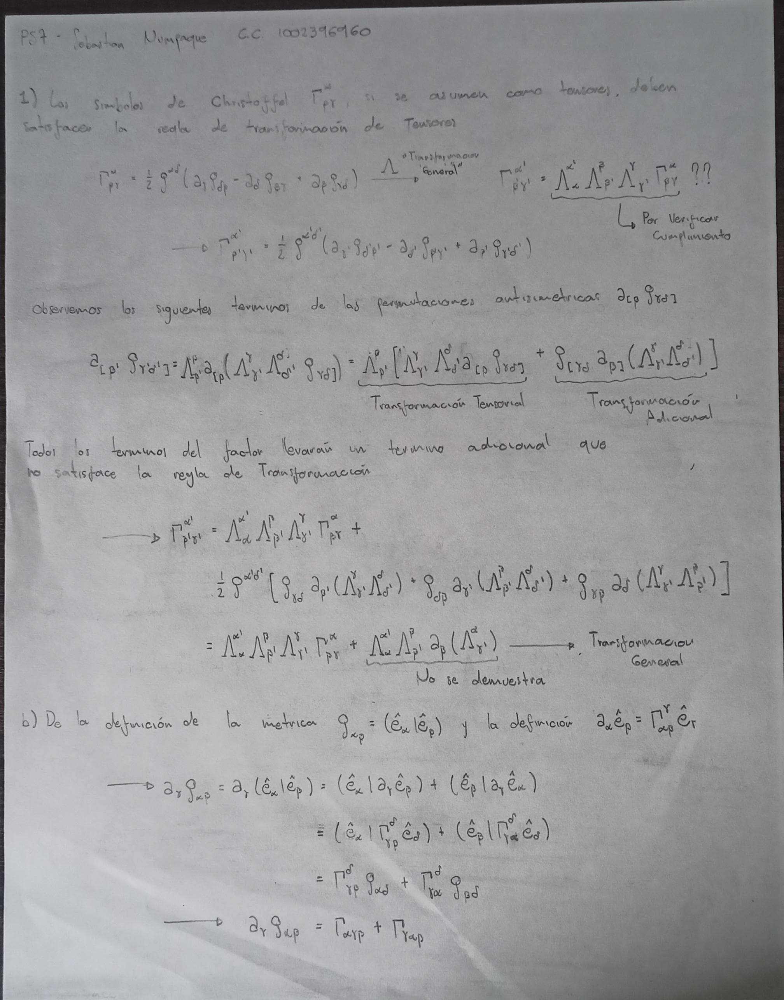

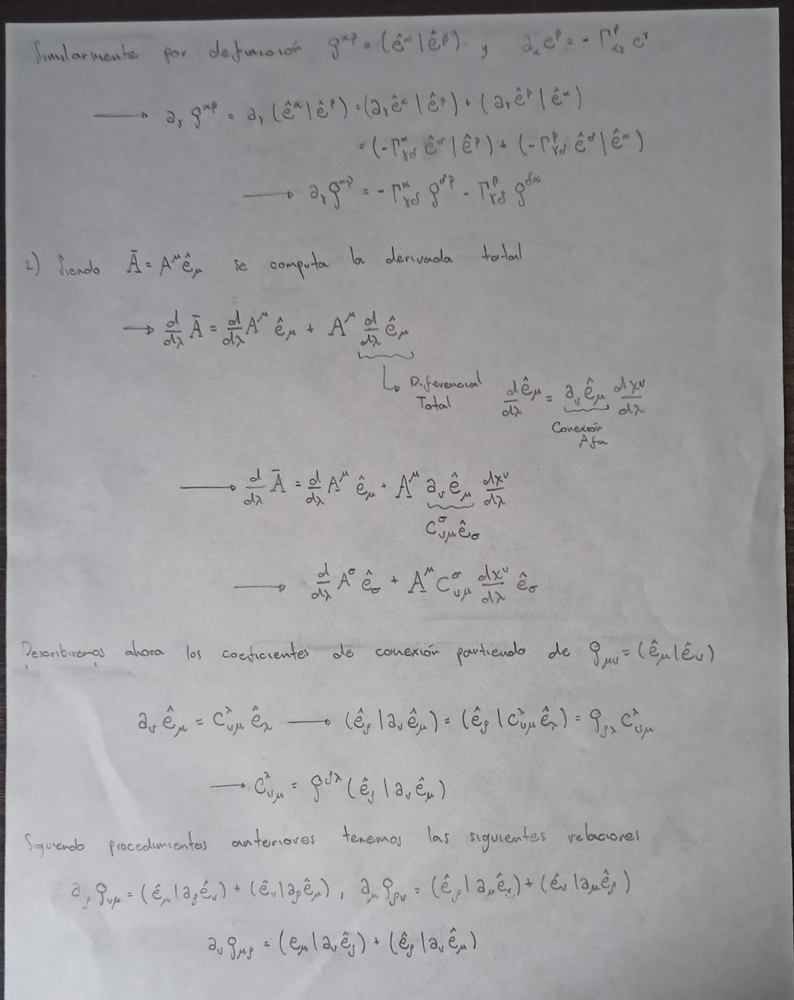

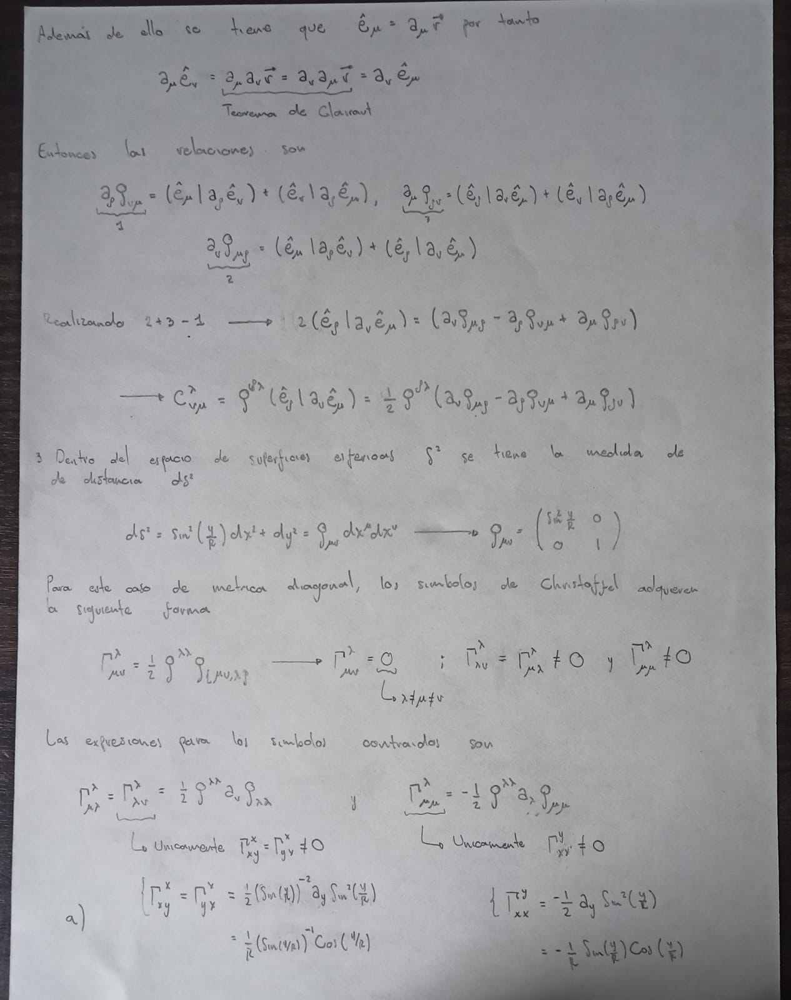

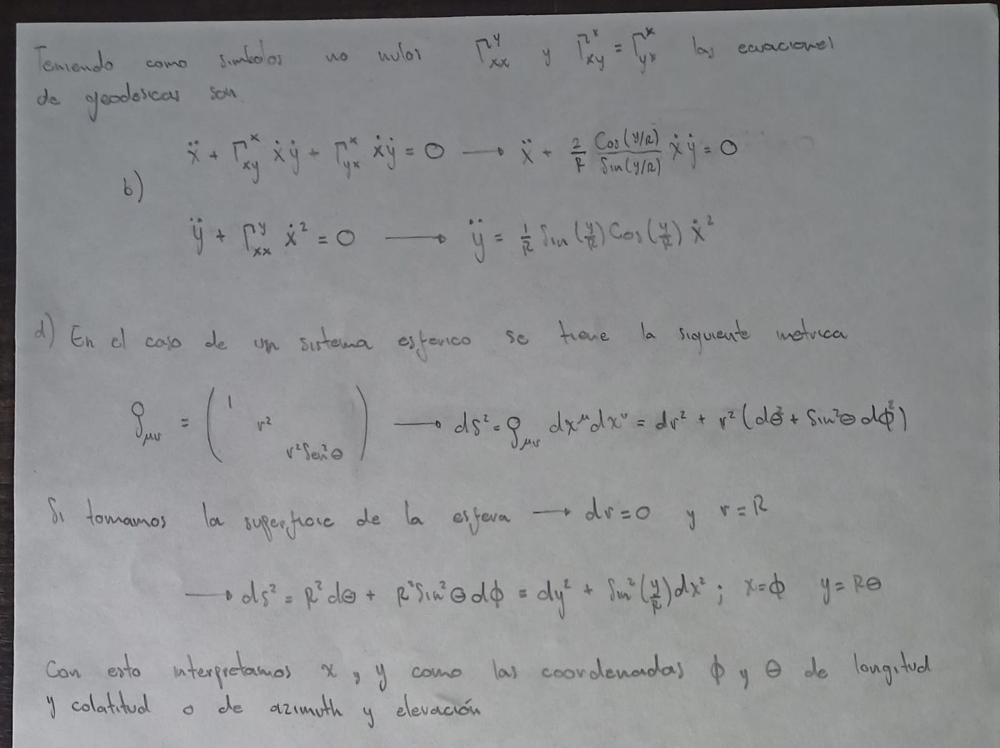

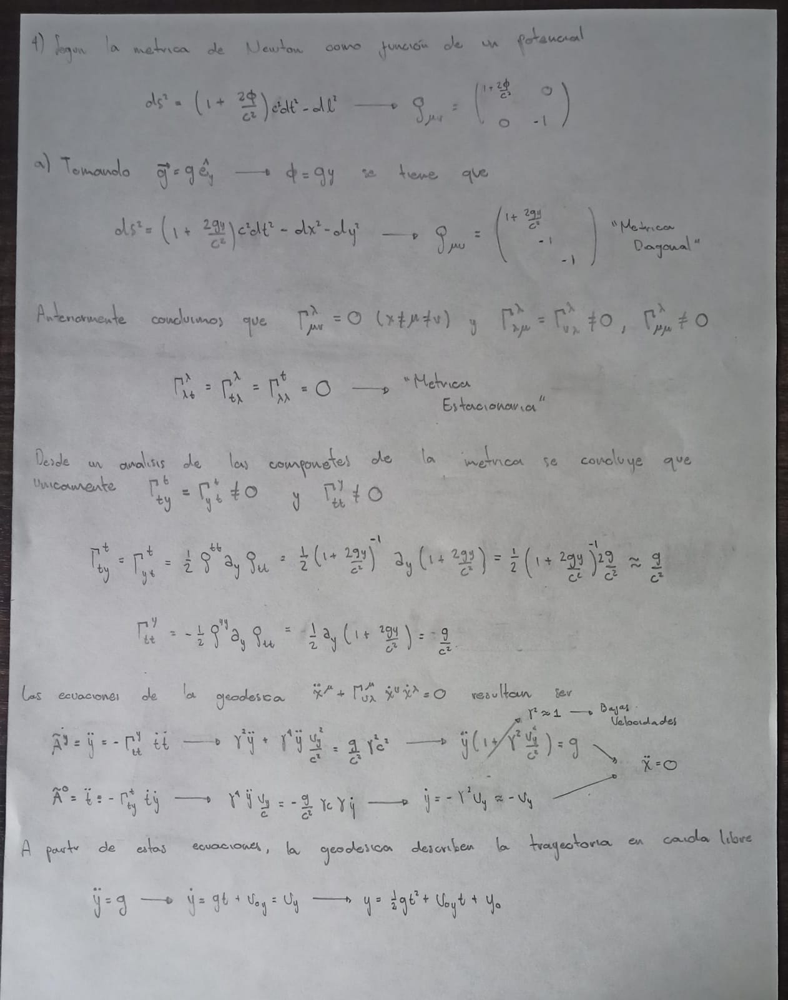

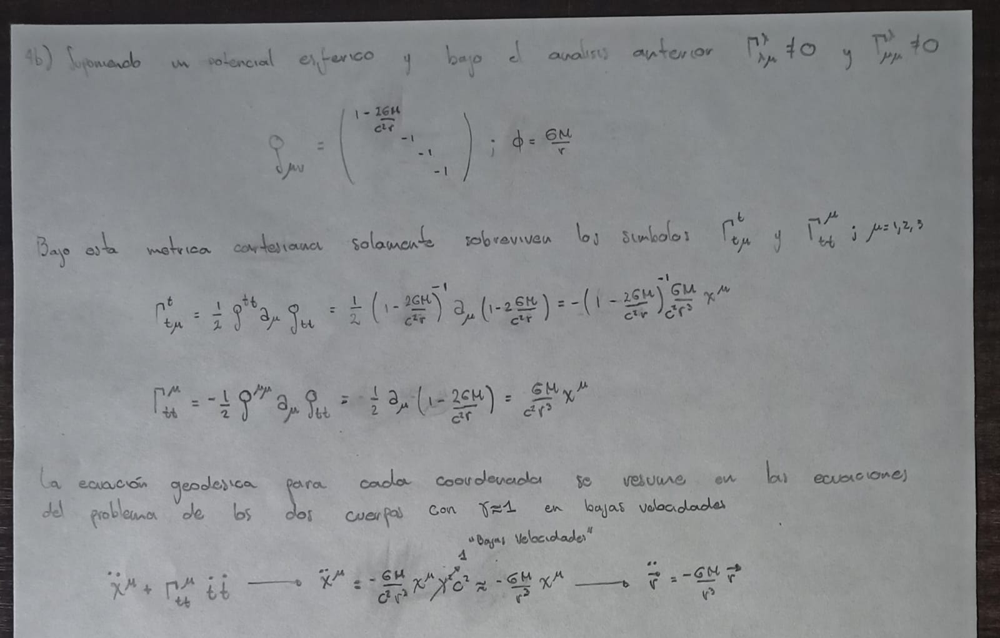